In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import os
from PIL import Image
from torchvision import transforms
import torch.nn.functional as F
import cv2
import torch

base_dir = '/home/linhuadong/DNFNet/jobs/prw_dnfnet_overlap_part_1p0_0p9/evaluate_result.pkl'
cpcl_dir = '/home/linhuadong/DNFNet/jobs/prw_cpcl_all_tricks/evaluate_result.pkl'
img_dir = '/home/linhuadong/DNFNet/tools/visualize/vis_person_search/cpcl'

with open(base_dir, "rb") as file:
    evaluate_base = pickle.load(file)
    
with open(cpcl_dir, "rb") as file:
    evaluate_cpcl = pickle.load(file)

base_results = evaluate_base['results']
cpcl_results = evaluate_cpcl['results']
image_root = '/home/linhuadong/dataset/PRW/frames'

DBSCAN: ap:0.03187053578771475, acc:[0, 1, 1]
cpcl: ap:0.2249117151543697, acc:[1, 1, 1]
DBSCAN: ap:0.12103670765462245, acc:[0, 1, 1]
cpcl: ap:0.3797933783758024, acc:[1, 1, 1]
DBSCAN: ap:0.1144304455084237, acc:[0, 1, 1]
cpcl: ap:0.4092599292215592, acc:[1, 1, 1]
DBSCAN: ap:0.03229324067540042, acc:[0, 1, 1]
cpcl: ap:0.09062859810540354, acc:[1, 1, 1]
DBSCAN: ap:0.04130351159219961, acc:[0, 1, 1]
cpcl: ap:0.13669176748177433, acc:[1, 1, 1]
DBSCAN: ap:0.005971161282186886, acc:[0, 0, 0]
cpcl: ap:0.11157543991652762, acc:[1, 1, 1]
DBSCAN: ap:0.08943195237369397, acc:[0, 1, 1]
cpcl: ap:0.1155273911692213, acc:[1, 1, 1]


/home/linhuadong/miniconda3/envs/mmdet/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


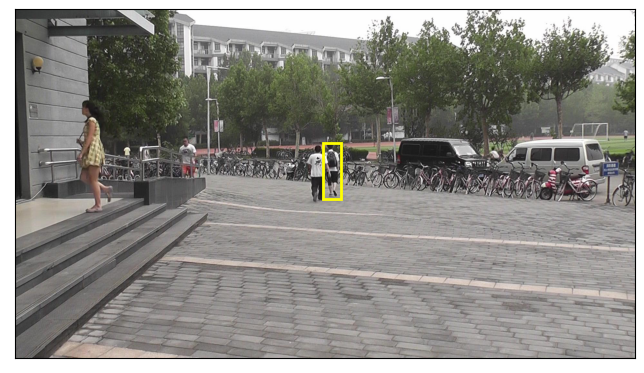

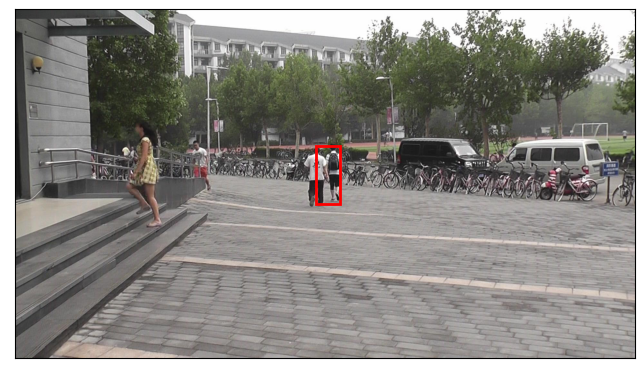

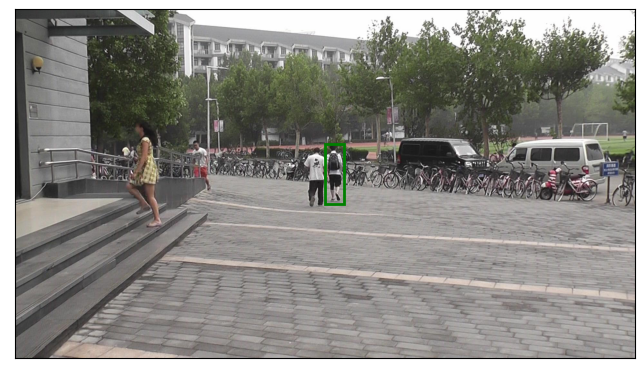

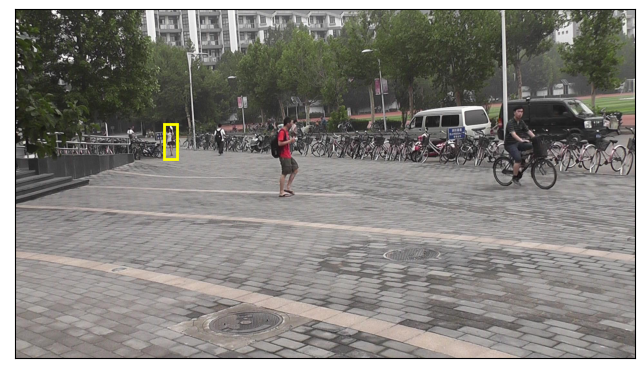

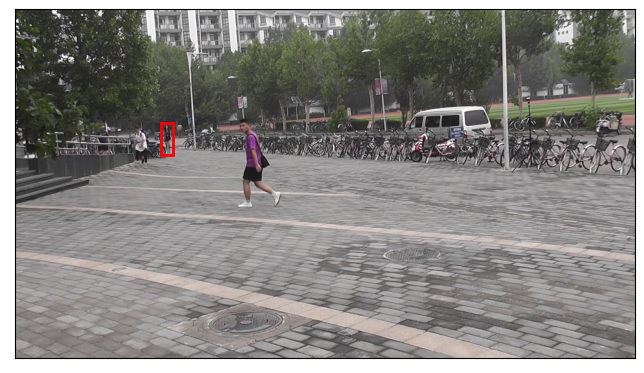

...

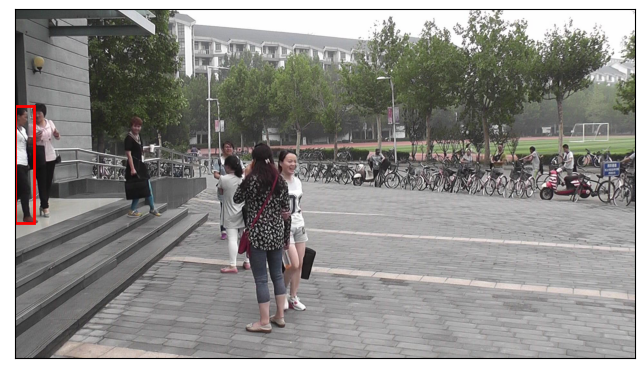

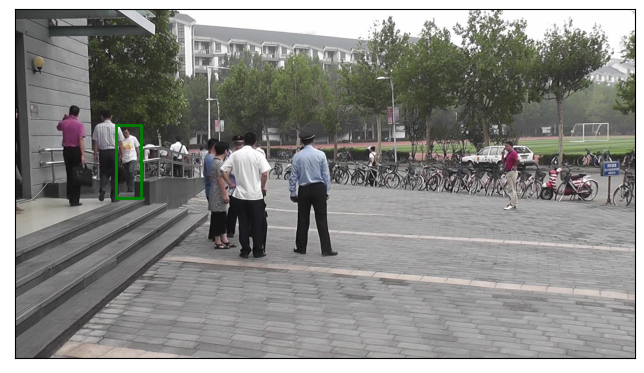

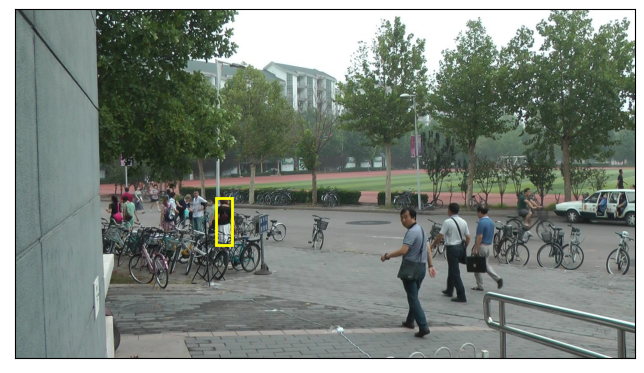

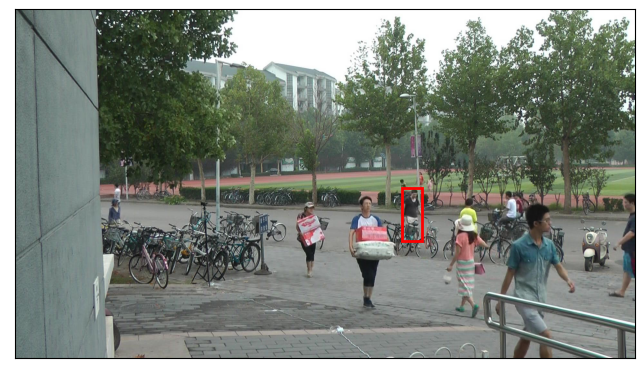

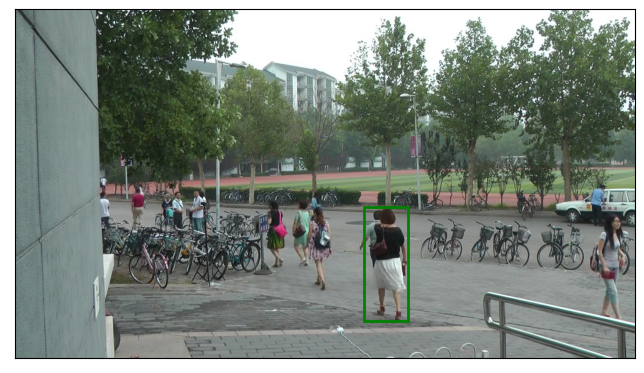

In [48]:
def visualize(probe_img, probe_roi, idx, color, name, k):
    folder = os.path.join(img_dir, str(idx))
    if not os.path.exists(folder):  #判断是否存在文件夹如果不存在则创建为文件夹
        os.makedirs(folder)

    file_root = os.path.join(image_root, probe_img)
    img = Image.open(file_root)
    plt.figure(figsize=(8, 8))
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img)

    ax = plt.gca()
    down_left_x, down_left_y = probe_roi[0], probe_roi[1]
    width = probe_roi[2] - probe_roi[0]
    height = probe_roi[3] - probe_roi[1]
    rect = plt.Rectangle((down_left_x, down_left_y), width, height, fill=False, edgecolor=color, linewidth=2)
    ax.add_patch(rect)

    # 前两个坐标点是左上角坐标, 后两个坐标点是右下角坐标, width在前, height在后
    if name == "query":
        save_name = "{}.jpg".format(name)
    else:
        save_name = "{}_top_{}.jpg".format(name, k)
    plt.savefig(os.path.join(folder, save_name), dpi=200, bbox_inches='tight', pad_inches=0)

def search(base_results, cpcl_results, idx):
    if base_results['acc'][0] == 0 and cpcl_results['acc'][0] == 1:
        colors = ['red', 'green']
        print("DBSCAN: ap:{}, acc:{}".format(base_results['ap'], base_results['acc']))
        print("cpcl: ap:{}, acc:{}".format(cpcl_results['ap'], cpcl_results['acc']))
        visualize(cpcl_results['probe_img'], cpcl_results['probe_roi'], idx, 'yellow', 'query', 0) # probe
        for j in range(0, 1, 1):
            base_info = base_results['gallery'][j]
            cpcl_info = cpcl_results['gallery'][j]
            visualize(base_info['img'], base_info['roi'][:4], idx, colors[base_info['correct']], "base", j + 1)  # gallery
            visualize(cpcl_info['img'], cpcl_info['roi'][:4], idx, colors[cpcl_info['correct']], "cpcl", j + 1)  # gallery
        return True

count = 0
for idx in range(0, len(cpcl_results), 10):
    if search(base_results[idx], cpcl_results[idx], idx):
        count += 1
        if(count == 7):
            break


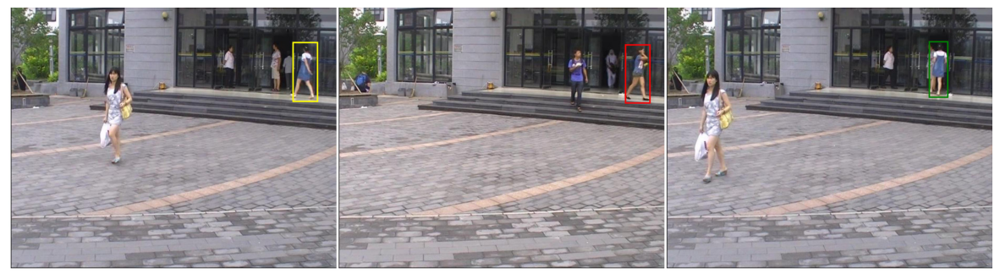

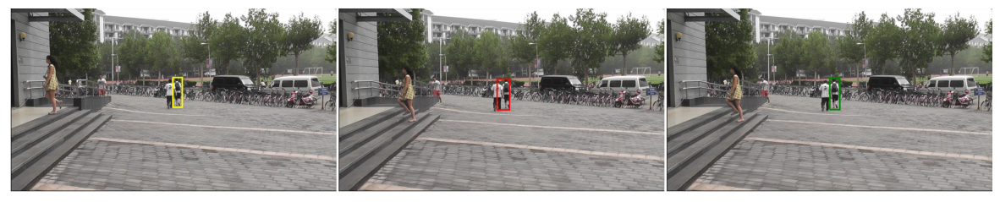

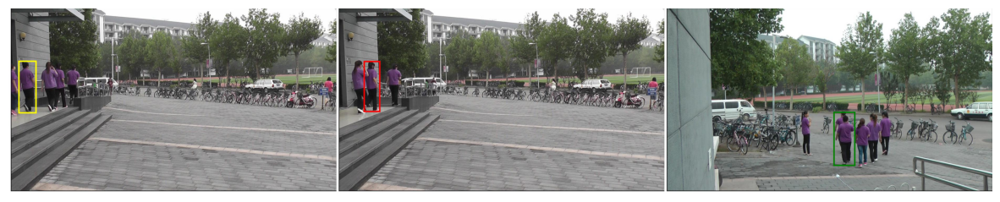

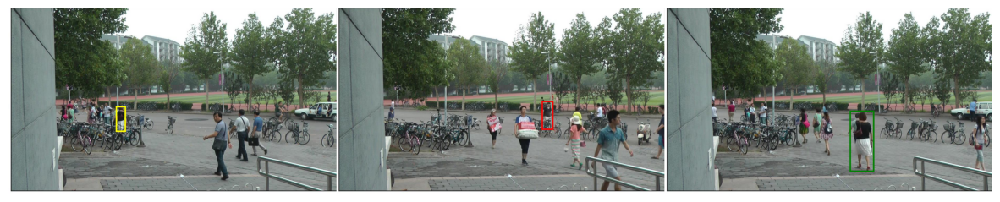

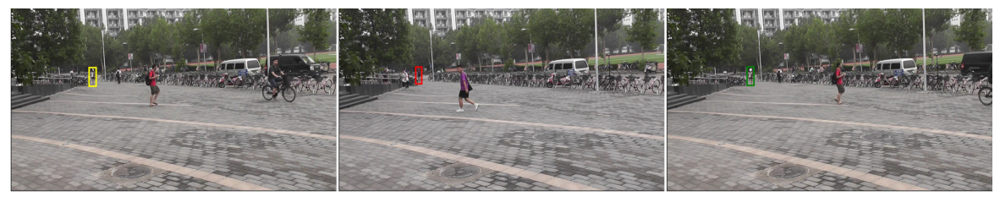

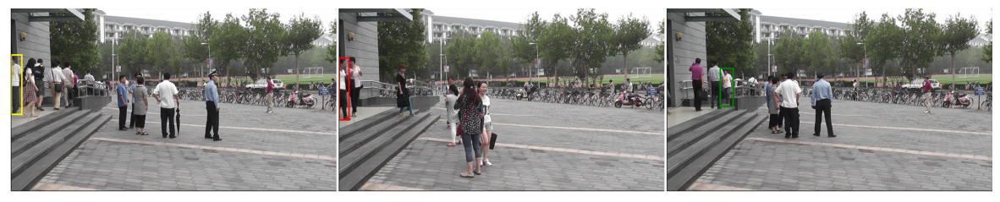

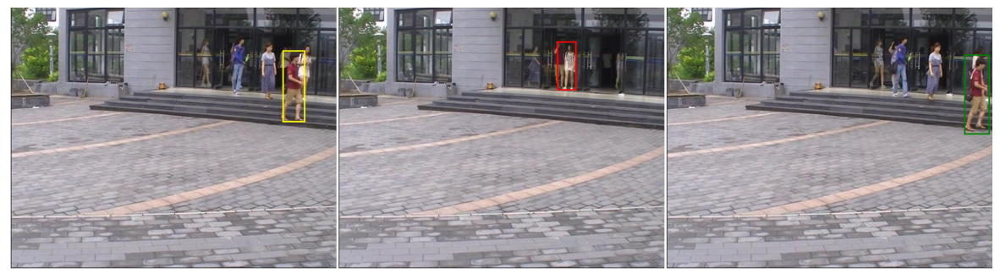

In [49]:
def cat_image(img_dir, name):
    cdir = os.path.join(img_dir, name)
    query = Image.open(os.path.join(cdir, "query.jpg"))
    cat_base = query
    for i in range(1):
        base_img = Image.open(os.path.join(cdir, "base_top_{}.jpg".format(i + 1)))
        cat_base = np.concatenate([cat_base, base_img], axis=1)

        cpcl_img = Image.open(os.path.join(cdir, "cpcl_top_{}.jpg".format(i + 1)))
        cat_base = np.concatenate([cat_base, cpcl_img], axis=1)

    plt.figure(figsize=(15, 15))
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.imshow(cat_base)
    dir_cat = os.path.join(img_dir, 'cat')
    if not os.path.exists(dir_cat):  #判断是否存在文件夹如果不存在则创建为文件夹
        os.makedirs(dir_cat)
    plt.savefig(dir_cat + "/{}.jpg".format(name), dpi=200, bbox_inches='tight', pad_inches=0)

filedir = os.listdir(img_dir)
for i, name in enumerate(filedir):
    if name == "cat":
        continue
    # if i > 1:
    #     break
    cat_image(img_dir, name)